#**<font color="#4863A0"> Filtering in the Frequency Domain  </font>**

**Nama Anggota - NPM**

**1. Bagus Al Farizi (2206048700)**  \\
**2. Prayoga Permana (2206030621)**  \\
**3. Fattan Raditya Anggoro (2206812533)**  \\
**4. Steven Sanjaya (2206030395)**  \\

## **<font color="#4863A0"> Opening Image  </font>**

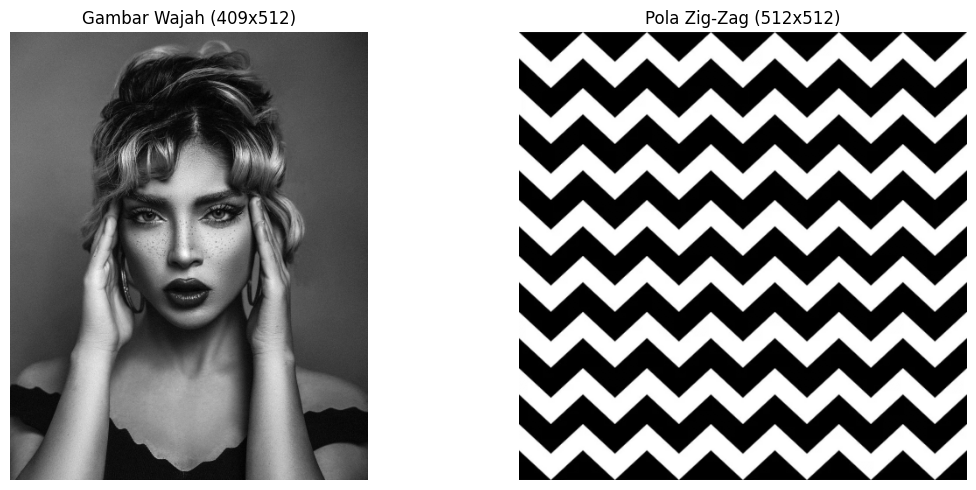

In [ ]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

def url_to_image(url, grayscale=True):
    resp = urllib.request.urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    flag = cv2.IMREAD_GRAYSCALE if grayscale else cv2.IMREAD_COLOR
    img = cv2.imdecode(image, flag)
    return img

def resize_with_aspect_ratio(img, height=512):
    h, w = img.shape
    ratio = height / h
    new_w = int(w * ratio)
    return cv2.resize(img, (new_w, height), interpolation=cv2.INTER_AREA)

def resize_exact(img, size=(512, 512)):
    return cv2.resize(img, size, interpolation=cv2.INTER_AREA)

# URL RAW
url_face = 'https://raw.githubusercontent.com/Bagusalfarizi/ADTT/main/pexels-peg1997-20140249.jpg'
url_pattern = 'https://raw.githubusercontent.com/Bagusalfarizi/ADTT/main/depositphotos_41729155-stock-illustration-zig-zag-simple-pattern-black.jpg'

# Load & Resize
img_face = resize_with_aspect_ratio(url_to_image(url_face), height=512)
img_pattern = resize_exact(url_to_image(url_pattern), size=(512, 512))

# Ukuran setelah resize
h1, w1 = img_face.shape
h2, w2 = img_pattern.shape

# Tampilkan
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_face, cmap='gray')
plt.title(f"Gambar Wajah ({w1}x{h1})")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_pattern, cmap='gray')
plt.title(f"Pola Zig-Zag ({w2}x{h2})")
plt.axis('off')

plt.tight_layout()
plt.show()


Berikut merupakan data citra asli yang diambil dari internet. Citra ini nantinya akan digunakan untuk mengaplikasikan berbagai filter di domain frekuensi.

## **<font color="#4863A0"> Transformasi Fourier 2D, Padding, Filtering di Domain Frekuensi  </font>**

In [ ]:
def fourier_transform(img):
    rows, cols = img.shape
    padded = np.pad(img, ((0, rows), (0, cols)), mode='constant')
    f = np.fft.fft2(padded)
    fshift = np.fft.fftshift(f)
    magnitude = 20 * np.log(np.abs(fshift) + 1)
    return fshift, magnitude, padded.shape

def inverse_fourier(fshift, original_shape):
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)
    return img_back[:original_shape[0]//2, :original_shape[1]//2]

def show_images(imgs, titles):
    plt.figure(figsize=(16, 5))
    for i, (img, title) in enumerate(zip(imgs, titles)):
        plt.subplot(1, len(imgs), i+1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()


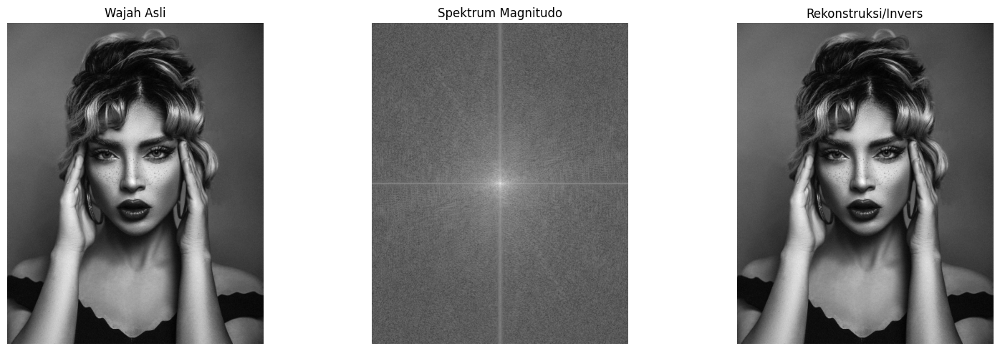

In [ ]:
fshift_face, mag_face, shape_face = fourier_transform(img_face)
recon_face = inverse_fourier(fshift_face, shape_face)

show_images([img_face, mag_face, recon_face],
            ['Wajah Asli', 'Spektrum Magnitudo', 'Rekonstruksi/Invers'])


Gambar di atas menunjukkan tiga tahap transformasi Fourier pada citra wajah grayscale. Gambar pertama adalah "Wajah Asli". Gambar kedua, "Spektrum Magnitudo", merupakan hasil transformasi Fourier dua dimensi setelah pergeseran pusat frekuensi, yang menampilkan distribusi informasi frekuensi—dengan komponen frekuensi rendah tampak terang di tengah. Gambar ketiga adalah hasil "Rekonstruksi/Invers", yaitu citra yang dikembalikan ke domain spasial. Kemiripan antara gambar asli dan hasil rekonstruksi menunjukkan bahwa transformasi Fourier dan inversnya berhasil mempertahankan struktur visual utama citra.

##**<font color="#4863A0"> Lowpass FIltering  </font>**

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def show_images(imgs, titles):
    plt.figure(figsize=(16, 5))
    for i, (img, title) in enumerate(zip(imgs, titles)):
        plt.subplot(1, len(imgs), i+1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def pad_image(img):
    return np.pad(img, ((0, img.shape[0]), (0, img.shape[1])), mode='constant')

def apply_filter(img, H):
    padded = pad_image(img)
    F = np.fft.fft2(padded)
    F_shift = np.fft.fftshift(F)
    G = H * F_shift
    G_ishift = np.fft.ifftshift(G)
    img_back = np.fft.ifft2(G_ishift)
    img_back = np.abs(img_back)
    return img_back[:img.shape[0], :img.shape[1]]


In [ ]:
def ideal_lowpass(shape, D0):
    P, Q = shape
    u, v = np.meshgrid(np.arange(Q) - Q//2, np.arange(P) - P//2)
    D = np.sqrt(u**2 + v**2)
    return np.where(D <= D0, 1, 0)

def gaussian_lowpass(shape, D0):
    P, Q = shape
    u, v = np.meshgrid(np.arange(Q) - Q//2, np.arange(P) - P//2)
    D = np.sqrt(u**2 + v**2)
    return np.exp(-(D**2) / (2 * D0**2))

def butterworth_lowpass(shape, D0, n):
    P, Q = shape
    u, v = np.meshgrid(np.arange(Q) - Q//2, np.arange(P) - P//2)
    D = np.sqrt(u**2 + v**2)
    return 1 / (1 + (D / D0)**(2 * n))

def run_lowpass_filters(img, D0=30, n=2):
    shape = (img.shape[0]*2, img.shape[1]*2)

    H_ideal = ideal_lowpass(shape, D0)
    H_gauss = gaussian_lowpass(shape, D0)
    H_butter = butterworth_lowpass(shape, D0, n)

    filtered_ideal = apply_filter(img, H_ideal)
    filtered_gauss = apply_filter(img, H_gauss)
    filtered_butter = apply_filter(img, H_butter)

    show_images([img, filtered_ideal, filtered_gauss, filtered_butter],
                ['Original', 'Ideal LPF', 'Gaussian LPF', 'Butterworth LPF'])

def run_lowpass_filters_by_D0(img, D0_list=[10, 30, 60, 100], n=2):
    shape = (img.shape[0]*2, img.shape[1]*2)

    for D0 in D0_list:
        H_ideal = ideal_lowpass(shape, D0)
        H_gauss = gaussian_lowpass(shape, D0)
        H_butter = butterworth_lowpass(shape, D0, n)

        filtered_ideal = apply_filter(img, H_ideal)
        filtered_gauss = apply_filter(img, H_gauss)
        filtered_butter = apply_filter(img, H_butter)

        show_images(
            [img, filtered_ideal, filtered_gauss, filtered_butter],
            [f'Original (D0={D0})', f'Ideal LPF (D0={D0})', f'Gaussian LPF (D0={D0})', f'Butterworth LPF (D0={D0})']
        )



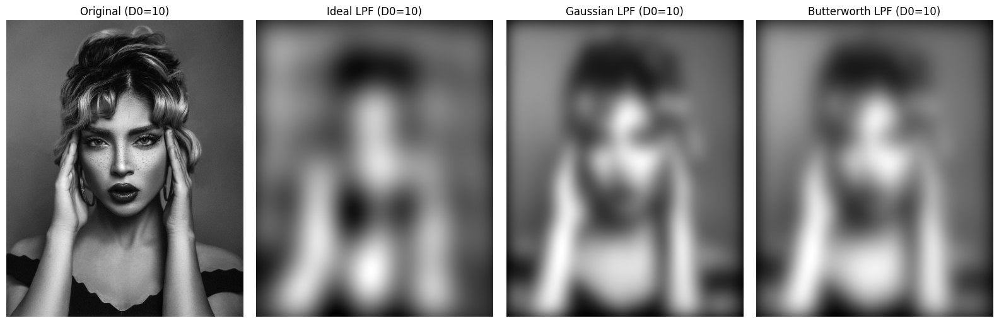

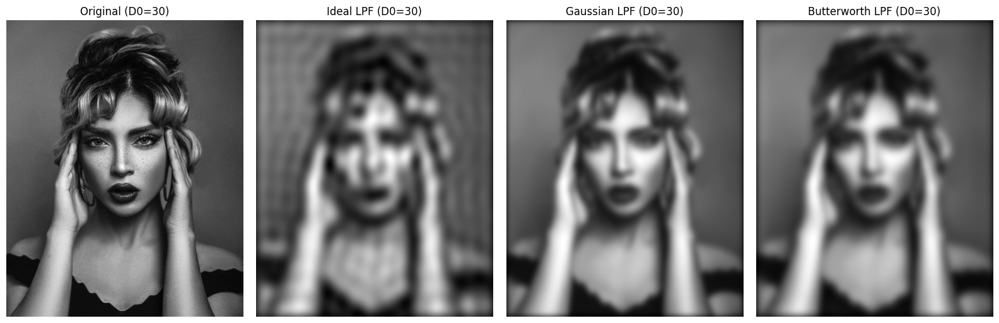

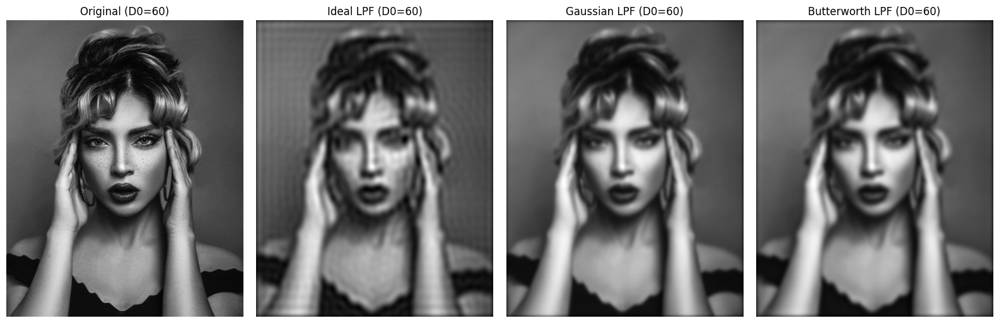

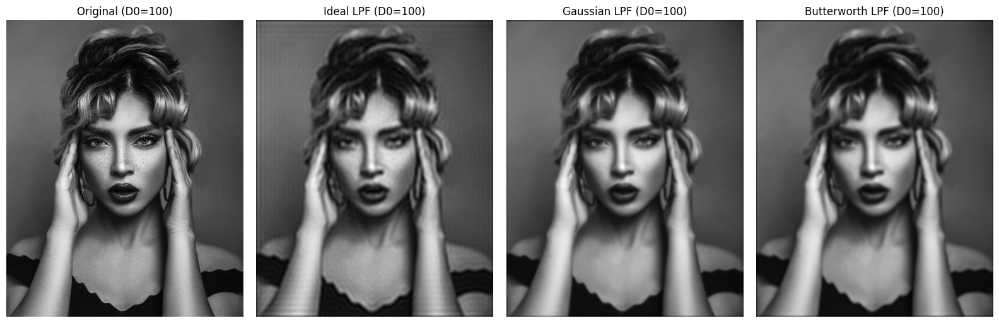

In [ ]:
run_lowpass_filters_by_D0(img_face, D0_list=[10, 30, 60, 100], n=2)

Gambar di atas Merupakan hasil penerapan Low-Pass Filter (LPF) frekuensi terhadap citra wajah wanita. Citra pertama adalah gambar asli, sedangkan tiga citra lainnya merupakan hasil pemrosesan dengan tiga jenis filter low-pass:



1.   **Ideal LPF**
2.   **Gaussian LPF**
3. **Butterworth LPF**

Fungsi **run_lowpass_filters_by_D0(img, D0_list, n)**
Melakukan iterasi terhadap beberapa nilai
D0

  (pada contoh yaitu : 10, 30, 60, 100).

Berguna untuk melihat efek perubahan cutoff frequency terhadap tingkat blur.

**apply_filter(img, H)**: Menerapkan filter frekuensi
𝐻 ke gambar melalui:

1. **FFT (Fast Fourier Transform)**

2. **Filtering di domain frekuensi**

3. **Inverse FFT ke domain spasial.**

Kesimpulannya yang didapatkan dari hasil penerapan Ideal Lowpass Filtering ini yaitu:
1. **Ideal LPF**: Blur kuat, tetapi kasar. Banyak detail hilang mendadak.

2. **Gaussian LPF**: Blur halus dan natural. Cocok untuk smoothing.

3. **Butterworth LPF**: Kualitas blur di antara ideal dan gaussian.

4. Semua hasil tergantung dari nilai D0 — semakin kecil D0, semakin besar efek blur.





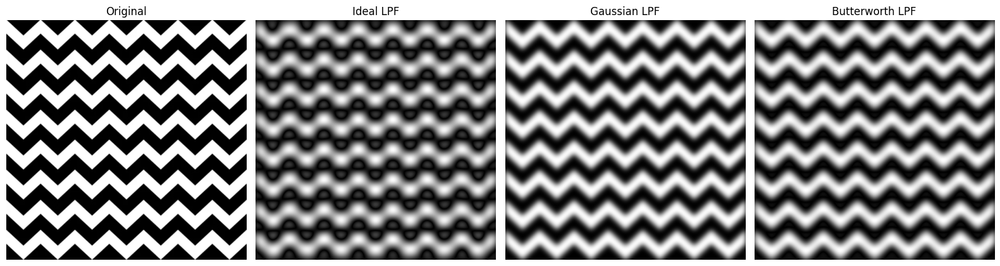

In [ ]:
# Untuk gambar zig-zag:
run_lowpass_filters(img_pattern, D0=30, n=2)

Gambar di atas Merupakan hasil penerapan Low-Pass Filter (LPF) frekuensi terhadap citra pola Zigzag. Gambar hasil low-pass filtering menunjukkan bahwa setiap jenis filter memiliki karakteristik peredaman frekuensi tinggi yang berbeda: Ideal LPF menghasilkan efek blur kuat dengan artefak gelombang (ringing) akibat pemotongan frekuensi yang tiba-tiba, Gaussian LPF memberikan hasil kabur yang lebih halus dan natural tanpa artefak, sementara Butterworth LPF berada di tengah-tengah, dengan tingkat kabur sedang dan transisi frekuensi yang lebih bertahap tergantung orde filternya. Secara keseluruhan, Gaussian dan Butterworth lebih cocok untuk aplikasi yang membutuhkan peredaman frekuensi tinggi tanpa mengorbankan kualitas visual secara drastis..

##**<font color="#4863A0"> Highpass FIltering  </font>**

In [ ]:
def highpass_from_lowpass(H):
    return 1 - H

def run_highpass_filters(img, D0=30, n=2):
    shape = (img.shape[0]*2, img.shape[1]*2)

    H_ideal = highpass_from_lowpass(ideal_lowpass(shape, D0))
    H_gauss = highpass_from_lowpass(gaussian_lowpass(shape, D0))
    H_butter = highpass_from_lowpass(butterworth_lowpass(shape, D0, n))

    filtered_ideal = apply_filter(img, H_ideal)
    filtered_gauss = apply_filter(img, H_gauss)
    filtered_butter = apply_filter(img, H_butter)

    show_images([img, filtered_ideal, filtered_gauss, filtered_butter],
                ['Original', 'Ideal HPF', 'Gaussian HPF', 'Butterworth HPF'])

def run_highpass_filters_by_D0(img, D0_list=[10, 30, 60, 100], n=2):
    shape = (img.shape[0]*2, img.shape[1]*2)

    for D0 in D0_list:
        H_ideal = highpass_from_lowpass(ideal_lowpass(shape, D0))
        H_gauss = highpass_from_lowpass(gaussian_lowpass(shape, D0))
        H_butter = highpass_from_lowpass(butterworth_lowpass(shape, D0, n))

        filtered_ideal = apply_filter(img, H_ideal)
        filtered_gauss = apply_filter(img, H_gauss)
        filtered_butter = apply_filter(img, H_butter)

        show_images(
            [img, filtered_ideal, filtered_gauss, filtered_butter],
            [f'Original (D0={D0})', f'Ideal HPF (D0={D0})', f'Gaussian HPF (D0={D0})', f'Butterworth HPF (D0={D0})']
        )


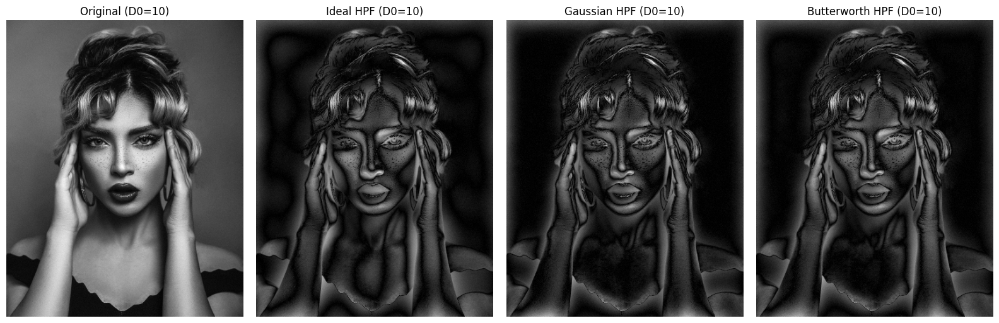

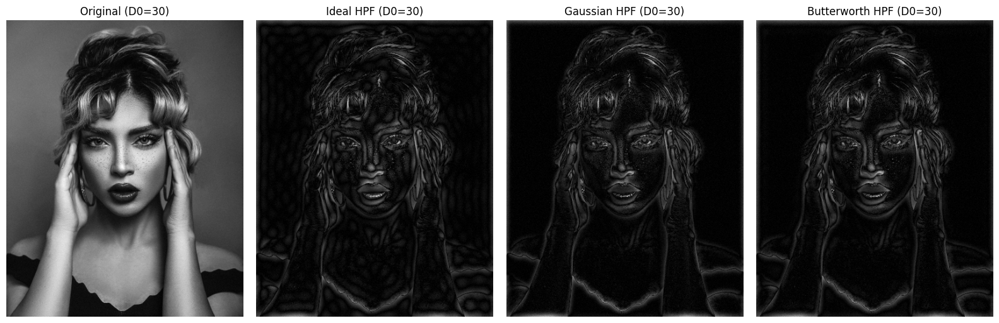

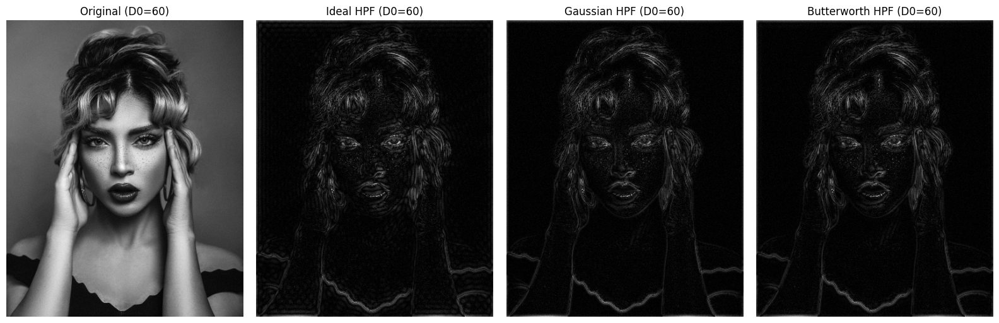

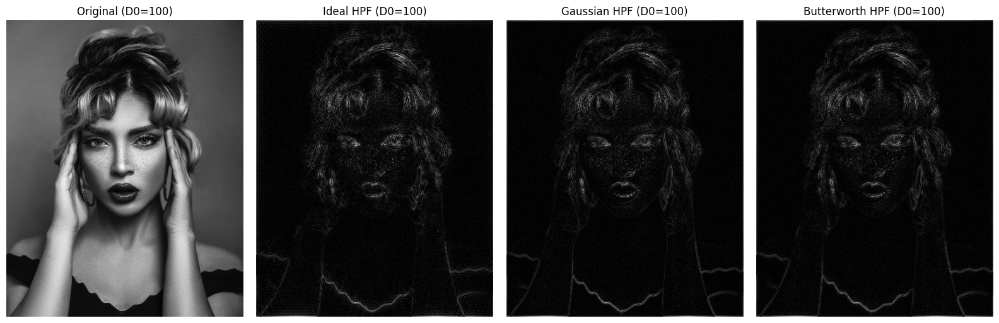

In [ ]:
run_highpass_filters_by_D0(img_face, D0_list=[10, 30, 60, 100], n=2)

Berikut adalah interpretasi dari gambar hasil penerapan High-Pass Filter (HPF) pada citra wajah wanita. Setiap baris menunjukkan efek dari tiga jenis filter high-pass dengan nilai cutoff frequency (D0) yang berbeda-beda: 10, 30, 60, dan 100. Setiap kolom menunjukkan jenis filter berbeda:


*   **Ideal HPF**
*   **Gaussian HPF**
*   **Butterworth HPF**


Fungsi Utama:
`run_highpass_filters_by_D0(img, D0_list, n)`
Fungsi ini menjalankan iterasi terhadap berbagai nilai D0 untuk melihat pengaruhnya terhadap ketajaman citra. Dalam contoh, digunakan nilai D0 = 10, 30, 60, dan 100.

`apply_filter(img, H)`
Proses ini mencakup:

1. **FFT (Fast Fourier Transform)** untuk mengubah citra ke domain frekuensi.

2. Penyaringan di domain frekuensi dengan filter HPF.

3. Inverse FFT untuk mengubah kembali ke domain spasial.

**Interpretasi Hasil:**
**Ideal HPF:**

1. Menyaring frekuensi rendah secara total.

2. Memberikan efek tajam tapi menghasilkan halo kasar dan artefak di tepi objek.

3. Terlihat jelas pada D0 kecil (misalnya D0=10), di mana tekstur kasar sangat menonjol.

**Gaussian HPF:**

1. Memberikan hasil yang lebih halus dan natural dibanding Ideal HPF.

2. Detil penting seperti tekstur kulit dan kontur wajah lebih terlihat tanpa noise berlebih.

3. Sangat cocok untuk aplikasi edge enhancement yang lembut.

**Butterworth HPF:**

1. Memberikan kompromi antara Ideal dan Gaussian.

2. Transisi frekuensinya lebih lambat daripada Ideal, tetapi lebih tajam dibanding Gaussian.

3. Hasilnya tajam namun tetap stabil, cocok untuk peningkatan fitur sedang.

**Kesimpulan:**
1. Semakin besar nilai D0, semakin lembut efek HPF dan semakin banyak frekuensi rendah yang dipertahankan, sehingga hasil citra mendekati aslinya.

2. Sebaliknya, semakin kecil nilai D0, semakin tajam hasilnya namun berisiko menimbulkan artefak kasar.

3. Gaussian HPF memberikan hasil paling natural dan halus.

4. Ideal HPF terlalu keras untuk kebanyakan aplikasi visual.

5. Butterworth HPF seimbang antara ketajaman dan kualitas visual.

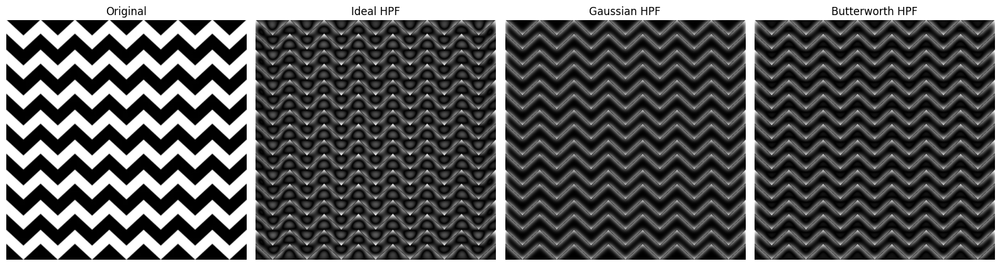

In [ ]:
run_highpass_filters(img_pattern, D0=30, n=2)

Gambar di atas memperlihatkan hasil penerapan tiga jenis High-Pass Filter (HPF)—Ideal, Gaussian, dan Butterworth—pada pola zigzag hitam-putih. Citra asli (kiri) menunjukkan pola tajam dengan kontras tinggi. Setelah difilter, ketiga metode HPF menonjolkan tepi dan detail frekuensi tinggi. Ideal HPF menghasilkan tepi dengan kontras tajam namun terlihat efek ringing (gelombang samping) karena transisi frekuensinya mendadak. Gaussian HPF menampilkan hasil yang lebih halus dan natural karena transisinya gradual. Butterworth HPF memberikan hasil yang seimbang—lebih tajam dari Gaussian, tapi lebih lembut dari Ideal. Ini menunjukkan bagaimana karakteristik filter mempengaruhi hasil pemrosesan citra dalam domain frekuensi.

##**<font color="#4863A0"> Unsharp Masking dan High-Boost Filtering </font>**

In [ ]:
def unsharp_masking(img, D0=30, filter_type='gaussian', k=1.0, n=2):
    padded = pad_image(img)
    shape = padded.shape

    # Pilih filter lowpass
    if filter_type == 'ideal':
        H = ideal_lowpass(shape, D0)
    elif filter_type == 'butterworth':
        H = butterworth_lowpass(shape, D0, n)
    elif filter_type == 'gaussian':
        H = gaussian_lowpass(shape, D0)
    else:
        raise ValueError("Unknown filter type")

    # Transformasi Fourier
    F = np.fft.fft2(padded)
    F_shift = np.fft.fftshift(F)

    # Blur versi citra (lowpass)
    G_blur = H * F_shift
    img_blur = np.abs(np.fft.ifft2(np.fft.ifftshift(G_blur)))

    # High-frequency component (mask)
    mask = padded - img_blur

    # High-boost result
    sharpened = padded + k * mask

    # Crop
    return sharpened[:img.shape[0], :img.shape[1]]


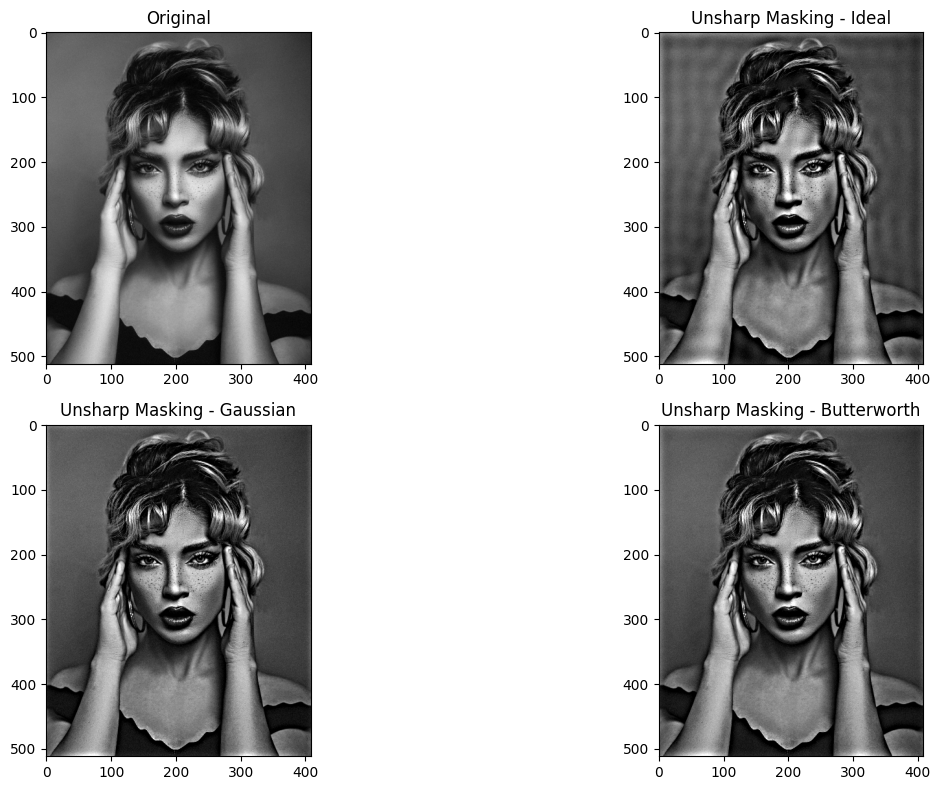

In [ ]:
# Terapkan Unsharp Masking dengan ketiga jenis filter
sharp_ideal = unsharp_masking(img_face, D0=30, filter_type='ideal', k=1.5)
sharp_gauss = unsharp_masking(img_face, D0=30, filter_type='gaussian', k=1.5)
sharp_butter = unsharp_masking(img_face, D0=30, filter_type='butterworth', k=1.5, n=2)

# Visualisasi hasil
plt.figure(figsize=(15, 8))

plt.subplot(2, 2, 1)
plt.imshow(img_face, cmap='gray')
plt.title("Original")
plt.axis('on')

plt.subplot(2, 2, 2)
plt.imshow(np.clip(sharp_ideal, 0, 255).astype(np.uint8), cmap='gray')
plt.title("Unsharp Masking - Ideal")
plt.axis('on')

plt.subplot(2, 2, 3)
plt.imshow(np.clip(sharp_gauss, 0, 255).astype(np.uint8), cmap='gray')
plt.title("Unsharp Masking - Gaussian")
plt.axis('on')

plt.subplot(2, 2, 4)
plt.imshow(np.clip(sharp_butter, 0, 255).astype(np.uint8), cmap='gray')
plt.title("Unsharp Masking - Butterworth")
plt.axis('on')

plt.tight_layout()
plt.show()


*   Ideal: Penajaman kuat tapi menghasilkan ringing artifacts di area transisi.
*   Gaussian: Penajaman lebih halus dan alami, cocok untuk hasil visual yang bersih.
*   Butterworth: Memberikan keseimbangan antara ketajaman dan minim distorsi.

Teknik ini mempertajam citra dengan menambahkan kembali komponen frekuensi tinggi (detail) yang diperoleh dari selisih antara citra asli dan versi blur-nya. Pemilihan filter mempengaruhi kualitas visual hasil unsharp masking, tergantung pada kebutuhan antara ketajaman dan artefak.

**🖼️ Interpretasi Output Visual**
- Citra Kiri Atas: Original
    - Citra asli grayscale.
    - Tampak halus, tanpa penajaman tambahan.

- Kanan Atas: Unsharp Masking - Ideal
    - Menggunakan ideal lowpass filter.
    - Hasil paling tajam dan kontras, tetapi bisa menimbulkan artefak di sekitar tepi akibat cutoff tajam.

- Kiri Bawah: Unsharp Masking - Gaussian
    - Menggunakan filter Gaussian yang lembut.
    - Hasil lebih alami dan halus, tetapi sedikit kurang tajam dibanding ideal.

- Kanan Bawah: Unsharp Masking - Butterworth
    - Filter transisi moderat, lebih fleksibel.
    - Keseimbangan antara ketajaman dan kehalusan.
    - Hasilnya lebih tajam dari Gaussian, tapi lebih stabil dari ideal (minim artefak).




In [ ]:
def homomorphic_filter(img, D0=30, rh=2.0, rl=0.5, c=1, filter_type='gaussian', n=2):
    img = img.astype(np.float32) + 1
    log_img = np.log(img)
    padded = pad_image(log_img)
    shape = padded.shape

    # Filter Highpass (1 - LPF)
    if filter_type == 'gaussian':
        H = 1 - gaussian_lowpass(shape, D0)
    elif filter_type == 'butterworth':
        H = 1 - butterworth_lowpass(shape, D0, n)
    elif filter_type == 'ideal':
        H = 1 - ideal_lowpass(shape, D0)
    else:
        raise ValueError("Unknown filter")

    # Scale filter: homomorphic formula
    H_homo = (rh - rl) * H + rl

    # Apply
    F = np.fft.fft2(padded)
    F_shift = np.fft.fftshift(F)
    G = H_homo * F_shift
    img_out = np.fft.ifft2(np.fft.ifftshift(G))
    img_exp = np.exp(np.abs(img_out)) - 1
    return np.clip(img_exp[:img.shape[0], :img.shape[1]], 0, 255)


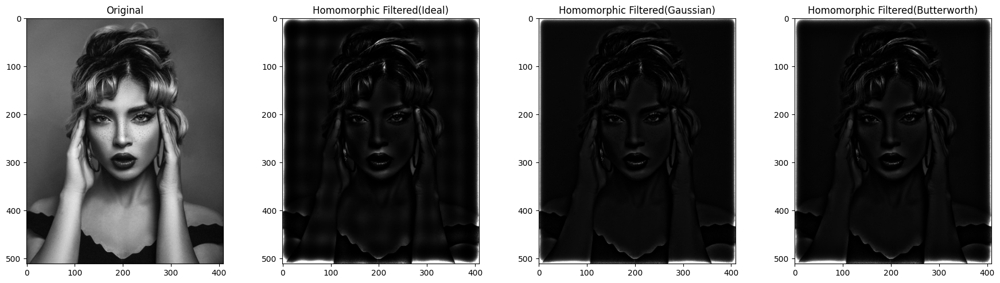

In [ ]:
homo_result_Ideal = homomorphic_filter(img_face, D0=20, rh=2.5, rl=0.5, c=1, filter_type='ideal')
homo_result_gaus = homomorphic_filter(img_face, D0=20, rh=2.5, rl=0.5, c=1, filter_type='gaussian')
homo_result_butter = homomorphic_filter(img_face, D0=20, rh=2.5, rl=0.5, c=1, filter_type='butterworth')

plt.figure(figsize=(18, 5))

plt.subplot(1, 4, 1)  # Menempatkan gambar original di posisi pertama
plt.imshow(img_face, cmap='gray')
plt.title("Original")

plt.subplot(1, 4, 2)  # Menempatkan gambar hasil filter Ideal di posisi kedua
plt.imshow(homo_result_Ideal.astype(np.uint8), cmap='gray')
plt.title("Homomorphic Filtered(Ideal)")

plt.subplot(1, 4, 3)  # Menempatkan gambar hasil filter Gaussian di posisi ketiga
plt.imshow(homo_result_gaus.astype(np.uint8), cmap='gray')
plt.title("Homomorphic Filtered(Gaussian)")

plt.subplot(1, 4, 4)  # Menempatkan gambar hasil filter Butterworth di posisi keempat
plt.imshow(homo_result_butter.astype(np.uint8), cmap='gray')
plt.title("Homomorphic Filtered(Butterworth)")

plt.tight_layout()
plt.show()


*   Ideal: Kontras tinggi tapi kasar dan menghasilkan artefak (ringing).
*   Gaussian: Lebih halus dan alami, kontras meningkat tanpa distorsi mencolok.
*   Butterworth: Seimbang, dengan transisi kontras yang smooth dan sedikit noise.

Homomorphic filtering adalah teknik pemrosesan citra untuk meningkatkan kualitas visual dengan menyeimbangkan pencahayaan dan meningkatkan detail. Metode ini bekerja dengan mengubah citra ke domain logaritmik untuk memisahkan komponen iluminasi (low frequency) dan reflektansi (high frequency),lalu menerapkan transformasi Fourier. Setelah penyaringan, citra dikembalikan ke domain spasial dengan inverse Fourier dan transformasi eksponensial, menghasilkan citra yang lebih kontras dan tajam terutama pada bagian detail.

##**<font color="#4863A0"> Selective Filtering Band-pass dan Band-Stop(Notch) </font>**

In [ ]:
def bandpass_filter(H_low, H_high):
    return H_high - H_low

def bandstop_filter(H_low, H_high):
    return 1 - bandpass_filter(H_low, H_high)


In [ ]:
def run_band_filters(img, D0_low=20, D0_high=60, n=2, filter_type='bandpass'):
    shape = (img.shape[0]*2, img.shape[1]*2)

    # Generate low and high cutoff filters
    H_ideal_low = ideal_lowpass(shape, D0_low)
    H_ideal_high = ideal_lowpass(shape, D0_high)

    H_gauss_low = gaussian_lowpass(shape, D0_low)
    H_gauss_high = gaussian_lowpass(shape, D0_high)

    H_butter_low = butterworth_lowpass(shape, D0_low, n)
    H_butter_high = butterworth_lowpass(shape, D0_high, n)

    # Select filter type
    if filter_type == 'bandpass':
        H_ideal = bandpass_filter(H_ideal_low, H_ideal_high)
        H_gauss = bandpass_filter(H_gauss_low, H_gauss_high)
        H_butter = bandpass_filter(H_butter_low, H_butter_high)
        title_suffix = 'Band-Pass'
    elif filter_type == 'bandstop':
        H_ideal = bandstop_filter(H_ideal_low, H_ideal_high)
        H_gauss = bandstop_filter(H_gauss_low, H_gauss_high)
        H_butter = bandstop_filter(H_butter_low, H_butter_high)
        title_suffix = 'Band-Stop (Notch)'
    else:
        raise ValueError("filter_type must be 'bandpass' or 'bandstop'")

    # Apply filters
    filtered_ideal = apply_filter(img, H_ideal)
    filtered_gauss = apply_filter(img, H_gauss)
    filtered_butter = apply_filter(img, H_butter)

    show_images(
        [img, filtered_ideal, filtered_gauss, filtered_butter],
        [f'Original', f'Ideal {title_suffix}', f'Gaussian {title_suffix}', f'Butterworth {title_suffix}']
    )


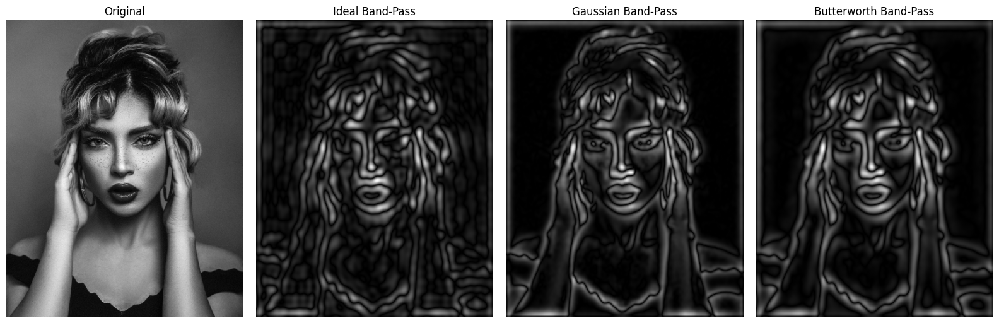

In [ ]:
run_band_filters(img_face, D0_low=20, D0_high=60, n=2, filter_type='bandpass')


1.   Ideal Band Pass \
Mempertajam detail seperti kontur wajah secara kuat, tapi menghasilkan artefak ringing karena transisi frekuensi yang tiba-tiba. Cocok untuk analisis frekuensi menengah, namun kurang halus secara visual.
2.   Gaussian Band Pass \
Menampilkan detail dengan halus tanpa artefak. Transisi antar area sangat mulus, menghasilkan gambar yang tajam namun tetap lembut. Ideal untuk peningkatan visual tanpa distorsi.
2.   Butterworth Band Pass \
Kompromi antara Ideal dan Gaussian. Memberikan ketajaman yang baik dengan transisi yang lebih terkontrol. Efek ringing minimal, cocok untuk keseimbangan antara ketajaman dan kehalusan.

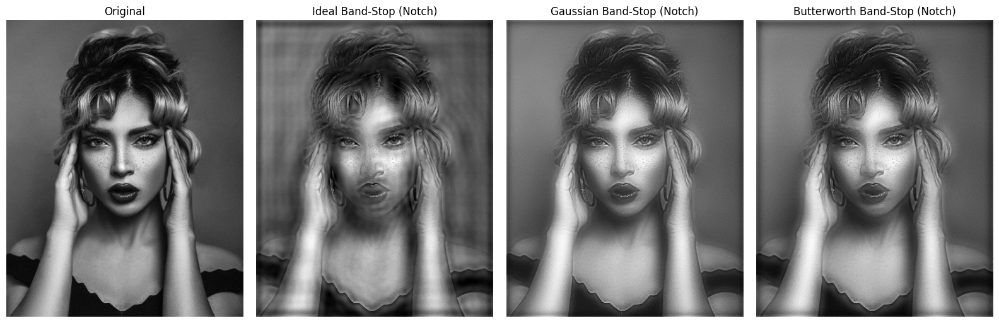

In [ ]:
run_band_filters(img_face, D0_low=20, D0_high=60, n=2, filter_type='bandstop')


1.   Ideal Band Stop \
Menghilangkan seluruh frekuensi di dalam rentang tertentu secara mendadak dan total. Dapat dilihat terdapat distorsi atau ghosting (seolah gambar berganda di wajah), tekstur kulit dan rambutnya jadi tidak natural-sebagian detail hilang mendadak, dan terjadi efek riak akibat pemotongan frekuensi secara mendadak. Tidak cocok untuk aplikasi estetis atau medis; berguna hanya untuk eksperimen teknik atau analisis spektrum.
2.   Gaussian Band Stop \
Membuat transisi yang sangat halus antara frekuensi yang diblokir dan yang dilewatkan. Dapat dilihat bahwa gambarnya lebih halus dan bersih (tanpa ghosting), tekstur wajahnya sedikit melembut-beberapa detail harus hilang, dan tidak terlihat artefak tajam sehingga menghasilkan gambar yang enak dipandang. Cocok untuk mengurangi noise atau detail mengganggu sambil tetap menjaga kualitas visual sehingga aman untuk aplikasi citra wajah, medis, dan lain-lain.
3.   Butterworth Band Stop \
Kompromi antara Ideal dan Gaussian. Dapat dilihat bahwa detail wajah tetap utuh dan jelas meskipun ada sedikit penghalusan, tidak muncul artefak atau ghosting, dan gambarnya terlihat alami dan realistis.Cocok untuk tugas-tugas real-word seperti pengolahan citra medis, wajah, atau dokumen.

##**<font color="#4863A0"> DFT Program dari GitHub </font>**

https://github.com/jeneese/image-dft-ifft/blob/main/image-dft-ifft.py

In [ ]:
def DFT2(f):
    """Menghitung DFT 2D dengan FFT pada tiap baris dan tiap kolom.

    Param:
        f: Citra grayscale yang telah diskalakan (nilai antara 0 dan 1)
    Returns:
        F: Transformasi Fourier 2D (kompleks)
    """
    imageHeight, imageWidth = f.shape
    F = np.zeros((imageHeight, imageWidth), dtype=complex)

    # FFT pada tiap baris
    for y in range(imageHeight):
        F[y, :] = np.fft.fft(f[y, :])

    # FFT pada tiap kolom
    for x in range(imageWidth):
        F[:, x] = np.fft.fft(F[:, x])

    return F

def IFFT(F):
    """Menghitung IFFT 2D untuk mendapatkan kembali citra asli.

    Param:
        F: Transformasi Fourier 2D (kompleks)
    Returns:
        g: Citra hasil IFFT (nilai real)
    """
    imageHeight, imageWidth = F.shape
    g = np.zeros((imageHeight, imageWidth), dtype=complex)

    # IFFT pada tiap kolom
    for x in range(imageWidth):
        g[:, x] = np.fft.ifft(F[:, x])

    # IFFT pada tiap baris
    for y in range(imageHeight):
        g[y, :] = np.fft.ifft(g[y, :])

    # Ambil bagian real
    g = np.real(g)
    return g

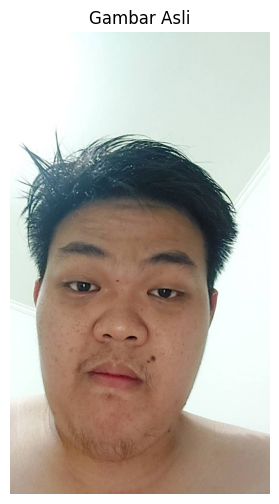

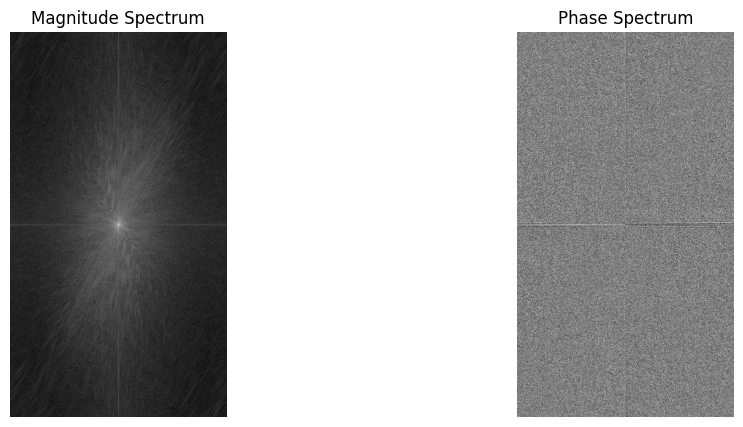

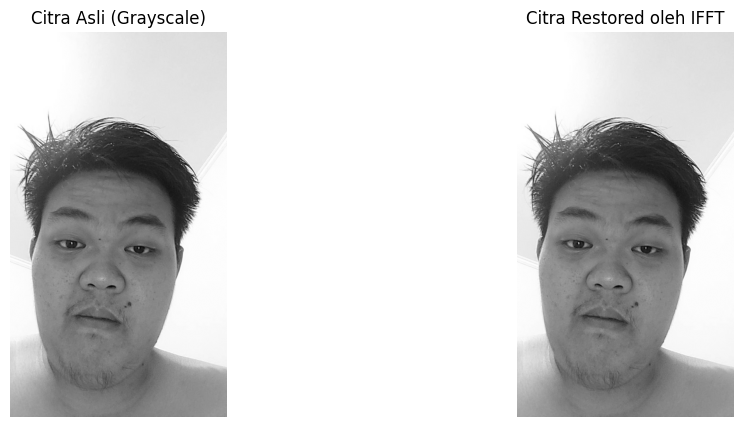

In [ ]:
def main():
    url = "https://raw.githubusercontent.com/Bagusalfarizi/tk1/refs/heads/main/11924.jpg"
    response = requests.get(url, stream=True).raw
    image_data = np.asarray(bytearray(response.read()), dtype=np.uint8)
    img = cv2.imdecode(image_data, cv2.IMREAD_COLOR)
    if img is None:
        raise ValueError("Gambar tidak dapat diunduh. Pastikan URL benar.")

    # Konversi gambar dari BGR ke RGB untuk tampilan, lalu ke grayscale untuk proses DFT
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Tampilkan gambar input
    plt.figure(figsize=(6,6))
    plt.imshow(img_rgb)
    plt.title("Gambar Asli")
    plt.axis("off")
    plt.show()

    # Skala nilai gambar ke rentang [0,1]
    f = gray / 255.0

    # Hitung DFT 2D
    F = DFT2(f)

    # Lakukan fftshift untuk memusatkan frekuensi nol
    F_shifted = np.fft.fftshift(F)
    magnitude_F = np.log(1 + np.abs(F_shifted))
    phase_F = np.angle(F_shifted)

    # Tampilkan spektrum magnitudo dan fase
    plt.figure(figsize=(12, 5))
    plt.subplot(121)
    plt.imshow(magnitude_F, cmap='gray')
    plt.title("Magnitude Spectrum")
    plt.axis("off")
    plt.subplot(122)
    plt.imshow(phase_F, cmap='gray')
    plt.title("Phase Spectrum")
    plt.axis("off")
    plt.show()

    # Hitung IFFT untuk mendapatkan kembali citra
    g = IFFT(F)

    # Tampilkan citra asli (grayscale) dan citra hasil IFFT
    plt.figure(figsize=(12, 5))
    plt.subplot(121)
    plt.imshow(f, cmap='gray')
    plt.title("Citra Asli (Grayscale)")
    plt.axis("off")
    plt.subplot(122)
    plt.imshow(g, cmap='gray')
    plt.title("Citra Restored oleh IFFT")
    plt.axis("off")
    plt.show()

if __name__ == "__main__":
    main()


This Python script performs the Discrete Fourier Transform on an image by applying a Fast Fourier Transform on each row of an image followed by each column to generate plots of the Magnitude and Phase spectrum of the original image. Then, the script performs the Inverse Fast Fourier Transform by taking the complex conjugate of the image, performing the DFT, and taking the real component of the complex conjugate to generate plots of the original image and the image restored by IFFT.

1. Transformasi Fourier (DFT2)
Fungsi DFT2(f):

      - Pertama melakukan FFT untuk setiap baris (1D FFT baris).

      - Kemudian FFT untuk setiap kolom hasil sebelumnya (1D FFT kolom).

      - Hasil akhir adalah DFT 2D dari citra.

2. Spektrum Magnitudo dan Fase
      - np.fft.fftshift() digunakan untuk memusatkan frekuensi nol (DC) ke tengah spektrum.

      - np.log(1 + abs(...)) digunakan untuk memperjelas nilai magnitudo agar bisa divisualisasikan.

      - np.angle() digunakan untuk mendapatkan fase dari setiap komponen frekuensi.

3. Rekonstruksi Gambar (IFFT)

      Fungsi IFFT(F):
      - Melakukan inverse FFT secara terbalik: kolom → baris.

      - Bagian np.real(...) diambil karena hasil IFFT bisa mengandung komponen imajiner sangat kecil akibat perhitungan numerik, meskipun input aslinya real.

**Interpretasi Visual Output**
- Karena hasil gambar rekonstruksi dan citra asli sangat mirip (hampir identik secara visual), ini menunjukkan bahwa:

  - Transformasi Fourier bersifat lossless (tanpa kehilangan data).

  - Proses DFT2 → IFFT berhasil mengembalikan gambar dengan akurasi sangat tinggi.

- Ini membuktikan bahwa domain frekuensi dapat digunakan sebagai representasi alternatif dari citra, misalnya untuk:

  - Filtering frekuensi

  - Kompresi citra

  - Deteksi tepi dan pola
